IMPORTING ALL THE LIBRARIES FOR MY FINANCIAL ANALYSIS

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import copy
from scipy import stats
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

 Read the stock data csv file, here's the list of the stocks considered:

AAPL = Apple Stock
BA = Boeing
T = AT&T
MGM = MGM Resorts International (Hotel Industry)
AMZN = Amazon
IBM = IBM
TSLA = Tesla Motors
GOOG = Google
sp500 = US Stock Market (S&P 500 is a stock market index that measures the stock performance of 500 large companies listed on U.S. stock exchange)

In [2]:
stocks_df = pd.read_csv('stock.csv')
stocks_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


Sorting the Stock csv file by Date

In [3]:
stocks_df = stocks_df.sort_values(by = ['Date'])
stocks_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,440.250000,174.279999,29.850000,16.719999,3205.030029,125.449997,1485.020020,1473.609985,3327.770020
2155,2020-08-06,455.609985,172.199997,29.840000,18.459999,3225.000000,126.120003,1489.579956,1500.099976,3349.159912
2156,2020-08-07,444.450012,170.020004,30.020000,19.030001,3167.459961,124.959999,1452.709961,1494.489990,3351.280029
2157,2020-08-10,450.910004,179.410004,30.200001,21.650000,3148.159912,127.110001,1418.569946,1496.099976,3360.469971


The Number of Stocks

In [4]:
print('Total Number of stocks : {}'.format(len(stocks_df.columns[1:])))

Total Number of stocks : 9


Name of the Stocks

In [5]:
print('Stocks under consideration are:')

for i in stocks_df.columns[1:]:
  print(i)

Stocks under consideration are:
AAPL
BA
T
MGM
AMZN
IBM
TSLA
GOOG
sp500


Check Any Null Values

In [6]:
stocks_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

DataFrame Information of the Stocks

In [7]:
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 185.5+ KB


Plotting The Graph Without Normalization

In [8]:
def show_plot(df, fig_title):
  df.plot(x = 'Date', figsize = (15,7), linewidth = 3, title = fig_title)
  plt.grid()
  plt.show()

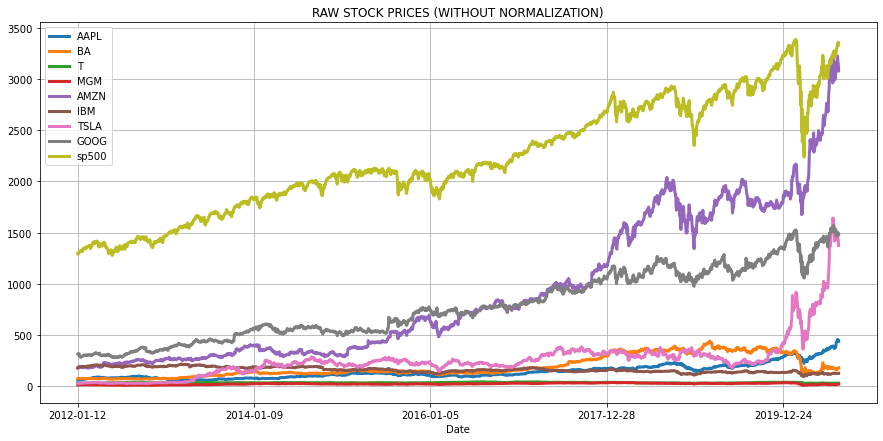

In [9]:
show_plot(stocks_df, 'RAW STOCK PRICES (WITHOUT NORMALIZATION)')

Normalized Plot of Stock data

In [10]:
def normalize(df):
  x = df.copy()

  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

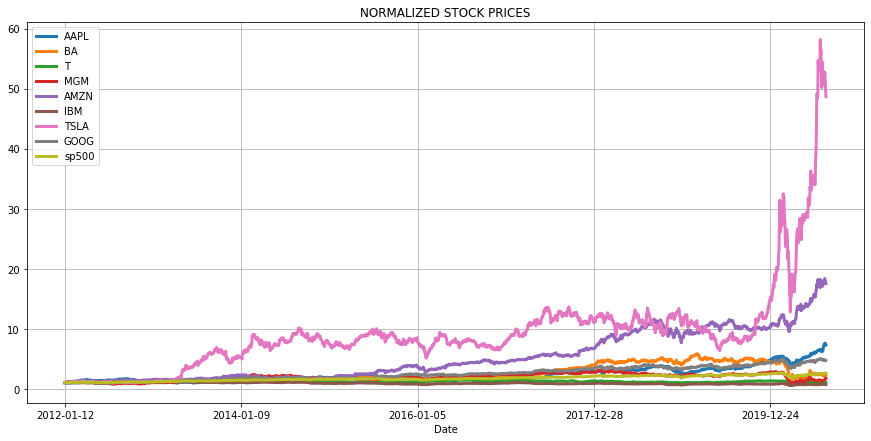

In [11]:
show_plot(normalize(stocks_df), 'NORMALIZED STOCK PRICES')

Interactive Data Plotting Using plotly express

In [12]:
def interactive_plot(df, title):
  fig = px.line(title = title)

  # Loop through each stock (while ignoring time columns with index 0)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Date'], y = df[i], name = i) # add a new Scatter trace

  fig.show()

In [13]:
interactive_plot(stocks_df, 'Prices')

In [14]:
interactive_plot(normalize(stocks_df), 'Normalized Prices')

Daily Stock return for "sp500"

In [15]:
df = stocks_df['sp500']

# Define a dataframe names df_daily_return
df_daily_return = df.copy()

#Loop through every element in the dataframe
for j in range(1, len(df)):

  # Calculate the percentage of change from the previous day
  df_daily_return[j] = ((df[j]- df[j-1])/df[j-1]) * 100

# put zero in the first line item
df_daily_return[0] = 0
df_daily_return

0       0.000000
1      -0.494792
2       0.355295
3       1.110793
4       0.493866
          ...   
2154    0.642974
2155    0.642770
2156    0.063303
2157    0.274222
2158   -0.796913
Name: sp500, Length: 2159, dtype: float64

Multiplpe Stocks Daily Return

In [16]:
def daily_return(df):
  df_daily_return = df.copy()

  for i in df.columns[1:]:

    for j in range(1, len(df)):
      df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100
    df_daily_return[i][0] = 0

  return df_daily_return

In [17]:
stocks_daily_return = daily_return(stocks_df)
stocks_daily_return

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2012-01-13,-0.374946,-1.205144,-0.166006,1.813685,1.415339,-0.769869,-19.327430,-0.738516,-0.494792
2,2012-01-17,1.164812,0.857909,0.598603,-0.809717,1.815943,0.468852,16.717854,0.574410,0.355295
3,2012-01-18,1.038382,-0.239234,0.264463,3.918367,4.282725,0.594448,0.789470,0.688856,1.110793
4,2012-01-19,-0.316937,0.666134,0.296736,0.549882,2.644634,-0.303752,-0.186494,1.052283,0.493866
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,0.362467,5.579446,-0.533156,0.000000,2.109065,-0.309917,-0.133153,0.589774,0.642974
2155,2020-08-06,3.488923,-1.193483,-0.033501,10.406699,0.623082,0.534082,0.307062,1.797626,0.642770
2156,2020-08-07,-2.449458,-1.265966,0.603217,3.087768,-1.784187,-0.919762,-2.475194,-0.373974,0.063303
2157,2020-08-10,1.453480,5.522880,0.599604,13.767729,-0.609323,1.720552,-2.350092,0.107728,0.274222


Correlations Between Daily Returns

In [18]:
cm = stocks_daily_return.drop(columns = ['Date']).corr()

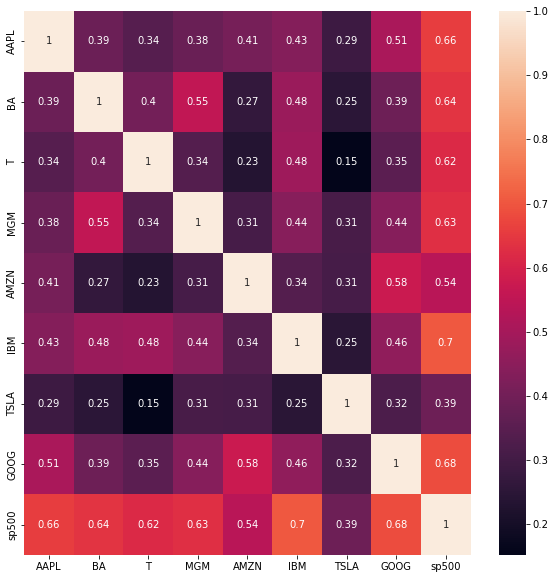

In [19]:
plt.figure(figsize=(10, 10))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax);

Histogram For Daily Returns

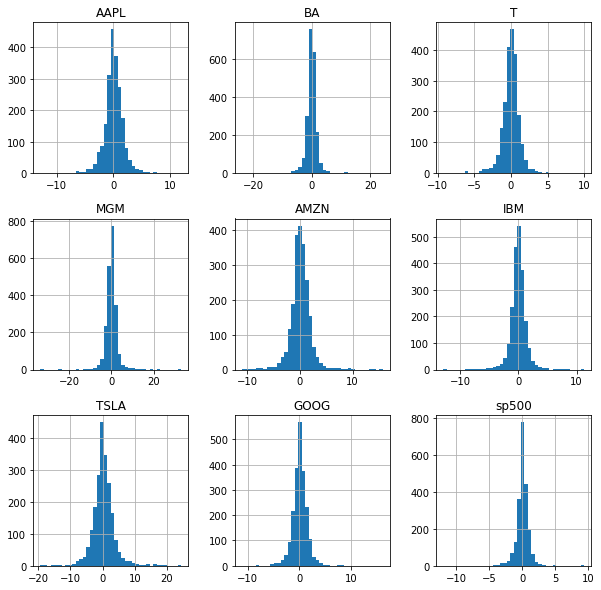

In [20]:
stocks_daily_return.hist(figsize=(10, 10), bins = 40);

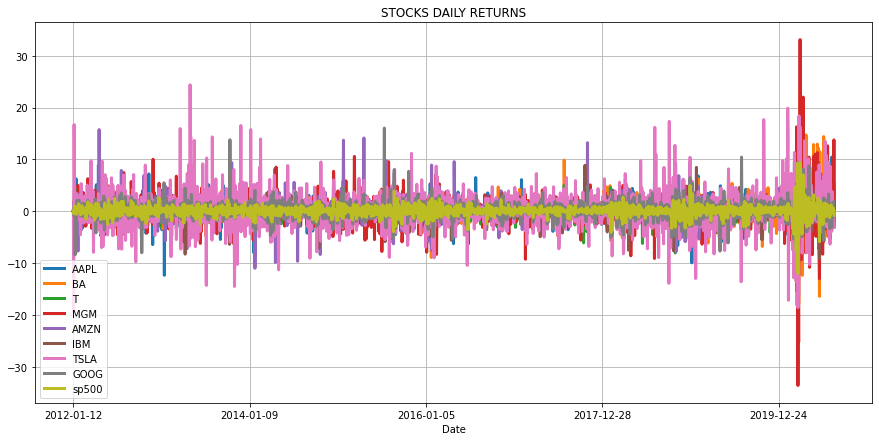

In [21]:
show_plot(stocks_daily_return, 'STOCKS DAILY RETURNS')

In [22]:
interactive_plot(stocks_daily_return, 'STOCKS DAILY RETURNS')

RANDOM ASSET ALLOCATION AND PROTFOLIO DAILY RETURN

In [23]:
np.random.seed(101)

# Create random weights for the stocks and normalize them
weights = np.array(np.random.random(9))

# Ensure that the sum of all weights are = 1
weights = weights / np.sum(weights)
print(weights)


[0.10921307 0.12069041 0.00602201 0.03627509 0.14492913 0.17636073
 0.06492024 0.1889901  0.15259921]


In [24]:
df_portfolio = normalize(stocks_df)
df_portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-13,0.996251,0.987949,0.998340,1.018137,1.014153,0.992301,0.806726,0.992615,0.995052
2,2012-01-17,1.007855,0.996424,1.004316,1.009893,1.032570,0.996954,0.941593,0.998317,0.998587
3,2012-01-18,1.018320,0.994040,1.006972,1.049464,1.076792,1.002880,0.949027,1.005193,1.009680
4,2012-01-19,1.015093,1.000662,1.009960,1.055235,1.105269,0.999834,0.947257,1.015771,1.014666
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,7.313297,2.308039,0.991036,1.378401,18.217644,0.694821,52.567080,4.698347,2.568715
2155,2020-08-06,7.568452,2.280493,0.990704,1.521847,18.331155,0.698532,52.728494,4.782805,2.585226
2156,2020-08-07,7.383066,2.251622,0.996680,1.568838,18.004093,0.692107,51.423361,4.764919,2.586862
2157,2020-08-10,7.490377,2.375977,1.002656,1.784831,17.894390,0.704016,50.214865,4.770052,2.593956


PORTFOLIO DATA ALLOCATION

In [25]:
df_portfolio.columns[1:]

Index(['AAPL', 'BA', 'T', 'MGM', 'AMZN', 'IBM', 'TSLA', 'GOOG', 'sp500'], dtype='object')

In [26]:
for counter, stock in enumerate(df_portfolio.columns[1:]):
  df_portfolio[stock] = df_portfolio[stock] * weights[counter]
  df_portfolio[stock] = df_portfolio[stock] * 1000000
df_portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,109213.072967,120690.407490,6022.010143,36275.090893,1.449291e+05,176360.729910,6.492024e+04,188990.104235,152599.209597
1,2012-01-13,108803.583155,119235.914699,6012.013247,36933.006803,1.469804e+05,175002.982837,5.237283e+04,187594.381427,151844.160487
2,2012-01-17,110070.940263,120258.850187,6048.001354,36633.954117,1.496495e+05,175823.488543,6.112844e+04,188671.942595,152383.655881
3,2012-01-18,111213.896735,119971.149581,6063.996069,38069.407013,1.560585e+05,176868.668340,6.161103e+04,189971.620676,154076.322712
4,2012-01-19,110861.418590,120770.317932,6081.990122,38278.743893,1.601857e+05,176331.426972,6.149613e+04,191970.659033,154837.252810
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,798707.600095,278558.118654,5968.027783,50001.606220,2.640267e+06,122539.200612,3.412668e+06,887941.003611,391983.847760
2155,2020-08-06,826573.895966,275233.575119,5966.028443,55205.122968,2.656718e+06,123193.660569,3.423147e+06,903902.858806,394503.400529
2156,2020-08-07,806327.319584,271749.212299,6002.016551,56909.729263,2.609318e+06,122060.571958,3.338417e+06,900522.495854,394753.132817
2157,2020-08-10,818047.125846,286757.593922,6038.004858,64744.906663,2.593418e+06,124160.687803,3.259961e+06,901492.611827,395835.632149


In [27]:
df_portfolio['portfolio daily worth in $'] = df_portfolio[df_portfolio != 'Date'].sum(axis = 1)
df_portfolio

C:\Users\DELL\AppData\Local\Temp\ipykernel_11520\2997231585.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,portfolio daily worth in $
0,2012-01-12,109213.072967,120690.407490,6022.010143,36275.090893,1.449291e+05,176360.729910,6.492024e+04,188990.104235,152599.209597,1.000000e+06
1,2012-01-13,108803.583155,119235.914699,6012.013247,36933.006803,1.469804e+05,175002.982837,5.237283e+04,187594.381427,151844.160487,9.847792e+05
2,2012-01-17,110070.940263,120258.850187,6048.001354,36633.954117,1.496495e+05,175823.488543,6.112844e+04,188671.942595,152383.655881,1.000669e+06
3,2012-01-18,111213.896735,119971.149581,6063.996069,38069.407013,1.560585e+05,176868.668340,6.161103e+04,189971.620676,154076.322712,1.013905e+06
4,2012-01-19,110861.418590,120770.317932,6081.990122,38278.743893,1.601857e+05,176331.426972,6.149613e+04,191970.659033,154837.252810,1.020814e+06
...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,798707.600095,278558.118654,5968.027783,50001.606220,2.640267e+06,122539.200612,3.412668e+06,887941.003611,391983.847760,8.588634e+06
2155,2020-08-06,826573.895966,275233.575119,5966.028443,55205.122968,2.656718e+06,123193.660569,3.423147e+06,903902.858806,394503.400529,8.664444e+06
2156,2020-08-07,806327.319584,271749.212299,6002.016551,56909.729263,2.609318e+06,122060.571958,3.338417e+06,900522.495854,394753.132817,8.506059e+06
2157,2020-08-10,818047.125846,286757.593922,6038.004858,64744.906663,2.593418e+06,124160.687803,3.259961e+06,901492.611827,395835.632149,8.450456e+06


In [28]:
df_portfolio['portfolio daily % return'] = 0.0000

for i in range(1, len(stocks_df)):
  # Calculate the percentage of change from the previous day
  df_portfolio['portfolio daily % return'][i] = ( (df_portfolio['portfolio daily worth in $'][i] - df_portfolio['portfolio daily worth in $'][i-1]) / df_portfolio['portfolio daily worth in $'][i-1]) * 100

df_portfolio

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500,portfolio daily worth in $,portfolio daily % return
0,2012-01-12,109213.072967,120690.407490,6022.010143,36275.090893,1.449291e+05,176360.729910,6.492024e+04,188990.104235,152599.209597,1.000000e+06,0.000000
1,2012-01-13,108803.583155,119235.914699,6012.013247,36933.006803,1.469804e+05,175002.982837,5.237283e+04,187594.381427,151844.160487,9.847792e+05,-1.522076
2,2012-01-17,110070.940263,120258.850187,6048.001354,36633.954117,1.496495e+05,175823.488543,6.112844e+04,188671.942595,152383.655881,1.000669e+06,1.613507
3,2012-01-18,111213.896735,119971.149581,6063.996069,38069.407013,1.560585e+05,176868.668340,6.161103e+04,189971.620676,154076.322712,1.013905e+06,1.322705
4,2012-01-19,110861.418590,120770.317932,6081.990122,38278.743893,1.601857e+05,176331.426972,6.149613e+04,191970.659033,154837.252810,1.020814e+06,0.681427
...,...,...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,798707.600095,278558.118654,5968.027783,50001.606220,2.640267e+06,122539.200612,3.412668e+06,887941.003611,391983.847760,8.588634e+06,0.879605
2155,2020-08-06,826573.895966,275233.575119,5966.028443,55205.122968,2.656718e+06,123193.660569,3.423147e+06,903902.858806,394503.400529,8.664444e+06,0.882669
2156,2020-08-07,806327.319584,271749.212299,6002.016551,56909.729263,2.609318e+06,122060.571958,3.338417e+06,900522.495854,394753.132817,8.506059e+06,-1.827981
2157,2020-08-10,818047.125846,286757.593922,6038.004858,64744.906663,2.593418e+06,124160.687803,3.259961e+06,901492.611827,395835.632149,8.450456e+06,-0.653686


PORTFOLIO DATA VISUALIZATION

In [29]:
fig = px.line(x = df_portfolio.Date, y = df_portfolio['portfolio daily % return'], title = 'Portfolio Daily % Return')
fig.show()

In [30]:
interactive_plot(df_portfolio.drop(['portfolio daily worth in $', 'portfolio daily % return'], axis = 1), 'Portfolio individual stocks worth in $ over time')

In [31]:
fig = px.histogram(df_portfolio, x = 'portfolio daily % return')
fig.show()

CUMMULATIVE RETURN OF THE PORTFOLIO

In [32]:
cummulative_return = ((df_portfolio['portfolio daily worth in $'][-1:] - df_portfolio['portfolio daily worth in $'][0])/ df_portfolio['portfolio daily worth in $'][0]) * 100
print('Cummulative return of the portfolio is {} %'.format(cummulative_return.values[0]))


Cummulative return of the portfolio is 725.668957781923 %


PORTFOLIO STANDARD DEVIATION

In [33]:
print('Standard deviation of the portfolio is {}'.format(df_portfolio['portfolio daily % return'].std()))

Standard deviation of the portfolio is 1.4491482034679337


AVERAGE DAILY RETURN

In [34]:
print('Average daily return of the portfolio is {} %'.format(df_portfolio['portfolio daily % return'].mean() ))

Average daily return of the portfolio is 0.10836656759421476 %


PORTFOLIO SHARPE RATIO

In [35]:
sharpe_ratio = df_portfolio['portfolio daily % return'].mean() / df_portfolio['portfolio daily % return'].std() * np.sqrt(252)
print('Sharpe ratio of the portfolio is {}'.format(sharpe_ratio))

Sharpe ratio of the portfolio is 1.187087646115862


NOW WE ARE CALCULATING THE PORTFOLIO DAILY RETURN

In [36]:
df_portfolio_daily_return = df_portfolio.drop(columns = ['Date', 'portfolio daily worth in $', 'portfolio daily % return'])
df_portfolio_daily_return = df_portfolio_daily_return.pct_change(1)
df_portfolio_daily_return

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.003749,-0.012051,-0.001660,0.018137,0.014153,-0.007699,-0.193274,-0.007385,-0.004948
2,0.011648,0.008579,0.005986,-0.008097,0.018159,0.004689,0.167179,0.005744,0.003553
3,0.010384,-0.002392,0.002645,0.039184,0.042827,0.005944,0.007895,0.006889,0.011108
4,-0.003169,0.006661,0.002967,0.005499,0.026446,-0.003038,-0.001865,0.010523,0.004939
...,...,...,...,...,...,...,...,...,...
2154,0.003625,0.055794,-0.005332,0.000000,0.021091,-0.003099,-0.001332,0.005898,0.006430
2155,0.034889,-0.011935,-0.000335,0.104067,0.006231,0.005341,0.003071,0.017976,0.006428
2156,-0.024495,-0.012660,0.006032,0.030878,-0.017842,-0.009198,-0.024752,-0.003740,0.000633
2157,0.014535,0.055229,0.005996,0.137677,-0.006093,0.017206,-0.023501,0.001077,0.002742


In [37]:
df_portfolio_daily_return.describe()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
count,2158.000000,2158.000000,2158.000000,2158.000000,2158.000000,2158.000000,2158.000000,2158.000000,2158.000000
mean,0.001077,0.000659,0.000082,0.000647,0.001512,-0.000061,0.002385,0.000844,0.000493
std,0.017762,0.022603,0.012651,0.027472,0.019283,0.014313,0.034308,0.015859,0.010491
min,-0.128647,-0.238484,-0.092410,-0.336140,-0.109972,-0.128507,-0.193274,-0.111008,-0.119841
25%,-0.006925,-0.007842,-0.005498,-0.011112,-0.007590,-0.006265,-0.013953,-0.006147,-0.003189
50%,0.000833,0.000782,0.000595,0.001117,0.001166,0.000220,0.001168,0.000612,0.000594
75%,0.010019,0.009467,0.006324,0.012761,0.011050,0.006600,0.018008,0.008610,0.005021
max,0.119808,0.243186,0.100223,0.331148,0.157457,0.113011,0.243951,0.160524,0.093828


In [38]:
portfolio_expected_return = np.sum(df_portfolio_daily_return.mean() * weights * 252)
portfolio_expected_return

0.20645913484232803

PORTFOLIO COVARIANCE

In [39]:
covariance = df_portfolio_daily_return.cov() * 252
covariance

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
AAPL,0.079501,0.038976,0.019331,0.047229,0.035407,0.027839,0.044308,0.036140,0.030866
BA,0.038976,0.128750,0.028941,0.086728,0.029377,0.039074,0.049040,0.035054,0.038353
T,0.019331,0.028941,0.040335,0.029794,0.014333,0.022096,0.016682,0.017883,0.020652
MGM,0.047229,0.086728,0.029794,0.190191,0.041252,0.043761,0.074076,0.048215,0.045861
AMZN,0.035407,0.029377,0.014333,0.041252,0.093698,0.023619,0.051694,0.044333,0.027505
IBM,0.027839,0.039074,0.022096,0.043761,0.023619,0.051627,0.030394,0.026246,0.026637
TSLA,0.044308,0.049040,0.016682,0.074076,0.051694,0.030394,0.296617,0.044261,0.035184
GOOG,0.036140,0.035054,0.017883,0.048215,0.044333,0.026246,0.044261,0.063382,0.028702
sp500,0.030866,0.038353,0.020652,0.045861,0.027505,0.026637,0.035184,0.028702,0.027735


PORTFOLIO VARIANCE

In [40]:
variance = np.dot(weights.T, np.dot(covariance, weights))
variance

0.04068271537989253

In [41]:
print('Potfolio Variance = {:.2f}%'.format(variance * 100))

Potfolio Variance = 4.07%


In [42]:
standard_deviation = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))
standard_deviation

0.20169956712866918

In [43]:
print('Potfolio standard deviation (volatility)) = {:.2f}%'.format(standard_deviation * 100))

Potfolio standard deviation (volatility)) = 20.17%


In [44]:
expected_volatility = standard_deviation

sharpe_ratio = portfolio_expected_return/expected_volatility
sharpe_ratio

1.0235973124851705

CAPITAL ASSET PRICING MODEL


In [45]:
stocks_daily_return = daily_return(stocks_df)
stocks_daily_return

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2012-01-13,-0.374946,-1.205144,-0.166006,1.813685,1.415339,-0.769869,-19.327430,-0.738516,-0.494792
2,2012-01-17,1.164812,0.857909,0.598603,-0.809717,1.815943,0.468852,16.717854,0.574410,0.355295
3,2012-01-18,1.038382,-0.239234,0.264463,3.918367,4.282725,0.594448,0.789470,0.688856,1.110793
4,2012-01-19,-0.316937,0.666134,0.296736,0.549882,2.644634,-0.303752,-0.186494,1.052283,0.493866
...,...,...,...,...,...,...,...,...,...,...
2154,2020-08-05,0.362467,5.579446,-0.533156,0.000000,2.109065,-0.309917,-0.133153,0.589774,0.642974
2155,2020-08-06,3.488923,-1.193483,-0.033501,10.406699,0.623082,0.534082,0.307062,1.797626,0.642770
2156,2020-08-07,-2.449458,-1.265966,0.603217,3.087768,-1.784187,-0.919762,-2.475194,-0.373974,0.063303
2157,2020-08-10,1.453480,5.522880,0.599604,13.767729,-0.609323,1.720552,-2.350092,0.107728,0.274222


Calculating BETA for a single stok

In [46]:
stocks_daily_return['AAPL']

0       0.000000
1      -0.374946
2       1.164812
3       1.038382
4      -0.316937
          ...   
2154    0.362467
2155    3.488923
2156   -2.449458
2157    1.453480
2158   -2.973987
Name: AAPL, Length: 2159, dtype: float64

In [47]:
stocks_daily_return['sp500']

0       0.000000
1      -0.494792
2       0.355295
3       1.110793
4       0.493866
          ...   
2154    0.642974
2155    0.642770
2156    0.063303
2157    0.274222
2158   -0.796913
Name: sp500, Length: 2159, dtype: float64

<AxesSubplot:xlabel='sp500', ylabel='AAPL'>

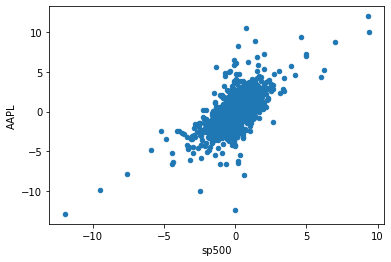

In [48]:
stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = 'AAPL')

In [49]:
beta, alpha = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return['AAPL'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('AAPL', beta, alpha))

Beta for AAPL stock is = 1.11289241486781 and alpha is = 0.052812084694402794


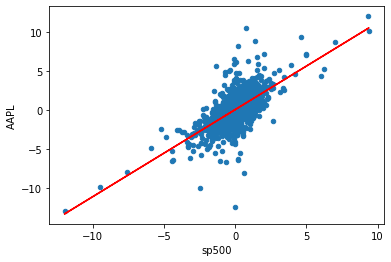

In [50]:

stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = 'AAPL')

plt.plot(stocks_daily_return['sp500'], beta * stocks_daily_return['sp500'] + alpha, '-', color = 'r')

In [51]:
beta

1.11289241486781

In [52]:
stocks_daily_return['sp500'].mean()

0.049316006600389206

In [53]:
rm = stocks_daily_return['sp500'].mean() * 252
rm

12.42763366329808

In [54]:
rf = 0

ER_AAPL = rf + ( beta * (rm-rf) )

In [55]:
ER_AAPL

13.830619238640288

BETA FOR ALL STOCKS

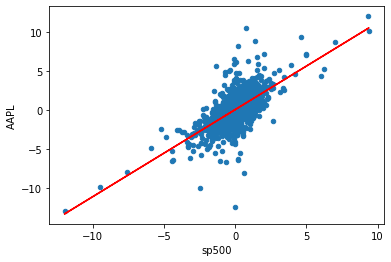

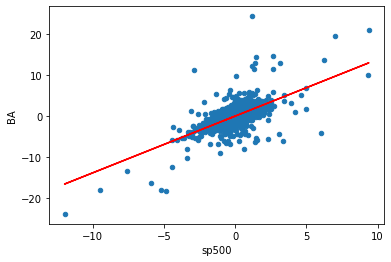

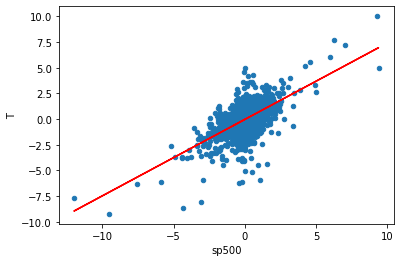

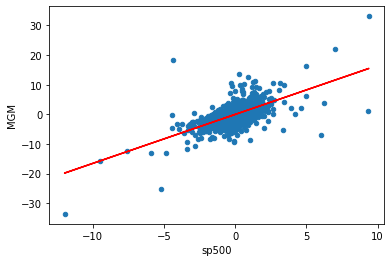

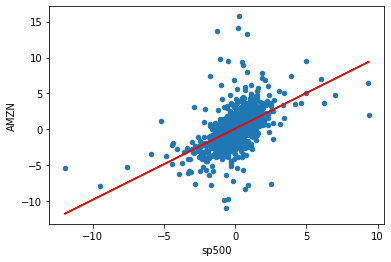

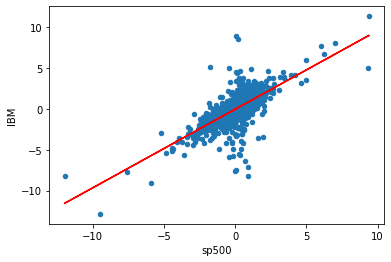

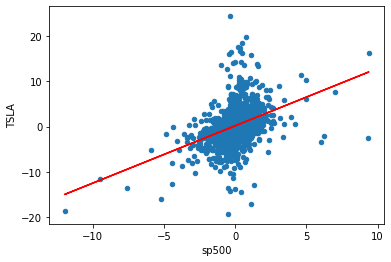

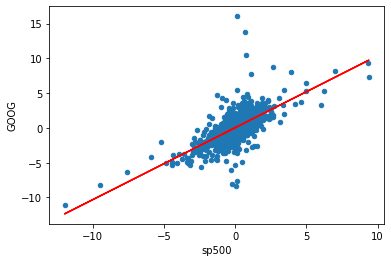

In [56]:
beta = {}
alpha = {}

# Loop on every stock daily return
for i in stocks_daily_return.columns:

  # Ignoring the date and S&P500 Columns
  if i != 'Date' and i != 'sp500':
    # plot a scatter plot between each individual stock and the S&P500 (Market)
    stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = i)

    # Fit a polynomial between each stock and the S&P500 (Poly with order = 1 is a straight line)
    b, a = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return[i], 1)

    plt.plot(stocks_daily_return['sp500'], b * stocks_daily_return['sp500'] + a, '-', color = 'r')

    beta[i] = b

    alpha[i] = a

    plt.show()

BETA AND ALPHA FOR EVERY STOCK

In [57]:
beta


{'AAPL': 1.11289241486781,
 'BA': 1.3828672010892786,
 'T': 0.7446293454747845,
 'MGM': 1.6535677065180125,
 'AMZN': 0.9917345712576845,
 'IBM': 0.9604149148095249,
 'TSLA': 1.268615010109591,
 'GOOG': 1.034881768742856}

In [58]:
alpha

{'AAPL': 0.052812084694402794,
 'BA': -0.002290698329753481,
 'T': -0.028563430198461675,
 'MGM': -0.016885305520479066,
 'AMZN': 0.10221396417765222,
 'IBM': -0.05345494150445117,
 'TSLA': 0.1758349216516586,
 'GOOG': 0.03335558721466998}

CALCULATE THE RETURN FOR THE PORTFOLIO - CAPITAL ASSET PRICING MODEL

In [59]:
keys = list(beta.keys())
keys

['AAPL', 'BA', 'T', 'MGM', 'AMZN', 'IBM', 'TSLA', 'GOOG']

In [60]:
ER = {}

rf = 0
rm = stocks_daily_return['sp500'].mean() * 252
rm

12.42763366329808

In [61]:
for i in keys:

  ER[i] = rf + ( beta[i] * (rm-rf) )

In [62]:
for i in keys:
  print('Expected Return Based on CAPM for {} is {}%'.format(i, ER[i]))

Expected Return Based on CAPM for AAPL is 13.830619238640288%
Expected Return Based on CAPM for BA is 17.185766980127916%
Expected Return Based on CAPM for T is 9.253980720502048%
Expected Return Based on CAPM for MGM is 20.549933694065853%
Expected Return Based on CAPM for AMZN is 12.324913942818489%
Expected Return Based on CAPM for IBM is 11.935684726020408%
Expected Return Based on CAPM for TSLA is 15.765882605403187%
Expected Return Based on CAPM for GOOG is 12.861131506762176%


In [63]:
portfolio_weights = 1/8 * np.ones(8)
portfolio_weights

array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125])

In [64]:
ER_portfolio = sum(list(ER.values()) * portfolio_weights)
ER_portfolio

14.213489176792546

COMPARING THE VALUES OF APPLE AND TESLA

1.268615010109591


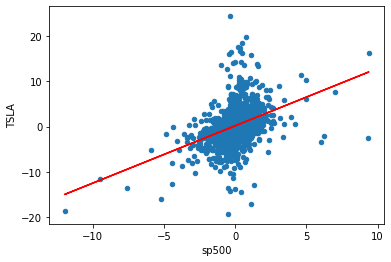

In [65]:
beta, alpha = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return['TSLA'], 1)
print(beta)
stocks_daily_return.plot(kind = 'scatter', x = 'sp500', y = 'TSLA')
plt.plot(stocks_daily_return['sp500'], beta * stocks_daily_return['sp500'] + alpha, '-', color = 'r')

CALCULATE THE RETRN FOR AT&T

In [66]:
beta, alpha = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return['T'], 1)
print('Beta for {} stock is = {} and alpha is = {}'.format('T', beta, alpha))

Beta for T stock is = 0.7446293454747845 and alpha is = -0.028563430198461675


In [67]:
ER_T = rf + ( beta * (rm - rf) )
print(ER_T)

9.253980720502048


In [68]:
for i in stocks_daily_return.columns:

  if i != 'Date' and i != 'sp500':


    fig = px.scatter(stocks_daily_return, x = 'sp500', y = i, title = i)


    b, a = np.polyfit(stocks_daily_return['sp500'], stocks_daily_return[i], 1)


    fig.add_scatter(x = stocks_daily_return['sp500'], y = b*stocks_daily_return['sp500'] + a)
    fig.show()

EXPECTED RETURN FOR THE PORTFOLIO ASSUMING WE ONL HAVE 50% ALLOCATION IN APPLE AND 50% IN AMAZON

In [69]:
ER['AMZN']

12.324913942818489

In [70]:
ER_portfolio = 0.5 * ER['AAPL'] +  0.5 * ER['AMZN']
ER_portfolio

13.07776659072939